# Evaluating image generation using NLTK synset lemmas vs using NLTK synset gloss(es)

## Requirements installation

In [ ]:
%pip install transformers accelerate diffusers tqdm ftfy nltk

import nltk

nltk.download('all')

## Loading 5 example synset

In [ ]:
from nltk.corpus import wordnet as wn
from pprint import pprint

synsets = [wn.synset('dog.n.01'),wn.synset('mansion.n.02'),wn.synset('grape.n.02'),wn.synset('sofa.n.01'),wn.synset('church.n.02')]
lemmas = []
for synset in synsets:
    lem = [str(lemma.name()).replace("_", " ") for lemma in synset.lemmas()]
    lemmas.append(', '.join(lem))
glosses = [synset.definition() for synset in synsets]

print('Lemmas:')
pprint(lemmas)
print('Glosses:')
pprint(glosses)

Lemmas:
['dog, domestic dog, Canis familiaris',
 'mansion, mansion house, manse, hall, residence',
 'grape, grapevine, grape vine',
 'sofa, couch, lounge',
 'church, church building']
Glosses:
['a member of the genus Canis (probably descended from the common wolf) that '
 'has been domesticated by man since prehistoric times; occurs in many breeds',
 'a large and imposing house',
 'any of numerous woody vines of genus Vitis bearing clusters of edible '
 'berries',
 'an upholstered seat for more than one person',
 'a place for public (especially Christian) worship']


## Image generation

### Initializing generator with manual seed

In [ ]:
import torch

def initialize_generator(self):
    gen = torch.Generator(device='cuda')
    seed = 26111998
    return gen.manual_seed(seed)

### Initializing the model

In [ ]:
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler
from tqdm import tqdm

model = "stabilityai/stable-diffusion-2"
# enabling cuDNN auto-tuner for faster convolution
torch.backends.cudnn.benchmark = True
pipe = StableDiffusionPipeline.from_pretrained(
    model,
    device_map="auto",
    revision="fp16",
    torch_dtype=torch.float16,
    safety_checker=None)
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to("cuda")
pipe.enable_attention_slicing()
generator = initialize_generator(pipe)

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


### Generating 5 images with stable diffusion using LEMMAS

In [ ]:
images_paths = []
for lemma in tqdm(lemmas):
    pipe(lemma, negative_prompt="writing, letters, handwriting, words",
         num_inference_steps=30,
         generator=generator,
         guidance_scale=7.5).images[0].save(f"{lemma.replace(' ', '_').replace(',', '-')}.png")
    images_paths.append(f"{lemma.replace(' ', '_').replace(',', '-')}.png")


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:16<01:04, 16.07s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

 40%|████      | 2/5 [00:32<00:48, 16.25s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

 60%|██████    | 3/5 [00:49<00:32, 16.46s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

 80%|████████  | 4/5 [01:05<00:16, 16.58s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

100%|██████████| 5/5 [01:22<00:00, 16.48s/it]


### Generating 5 images with stable diffusion using GLOSSES

In [ ]:
images_path_glosses = []
counter = 1
for gloss in tqdm(glosses):
    pipe(gloss, negative_prompt="writing, letters, handwriting, words",
         num_inference_steps=30,
         generator=generator,
         guidance_scale=7.5).images[0].save(f"gloss_{counter}.png")
    images_path_glosses.append(f"gloss_{counter}.png")
    counter += 1

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:16<01:05, 16.47s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

 40%|████      | 2/5 [00:32<00:49, 16.46s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

 60%|██████    | 3/5 [00:49<00:33, 16.53s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

 80%|████████  | 4/5 [01:06<00:16, 16.56s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

100%|██████████| 5/5 [01:22<00:00, 16.54s/it]


## Display the images and final results and considerations

### Lemmas images

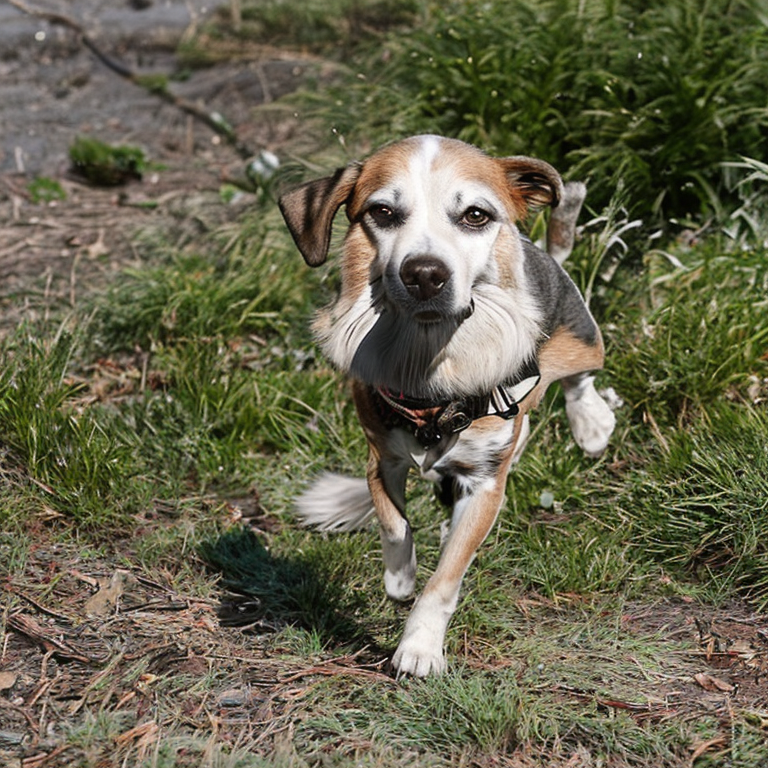

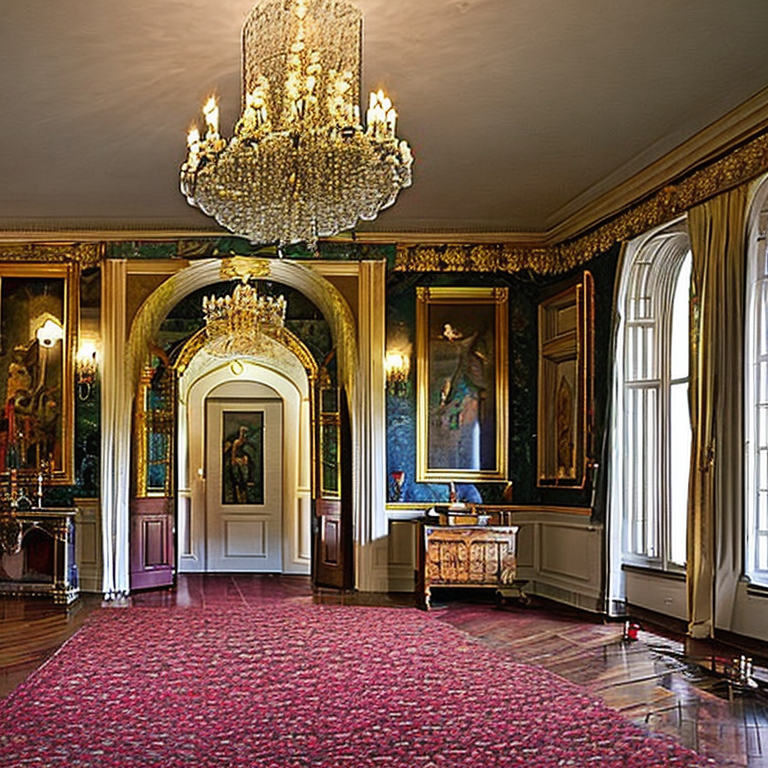

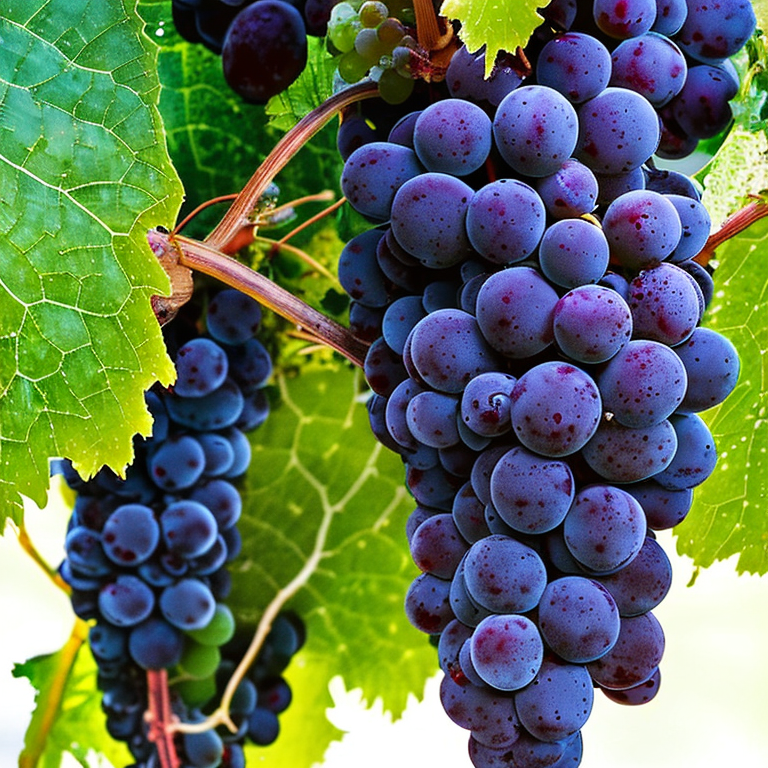

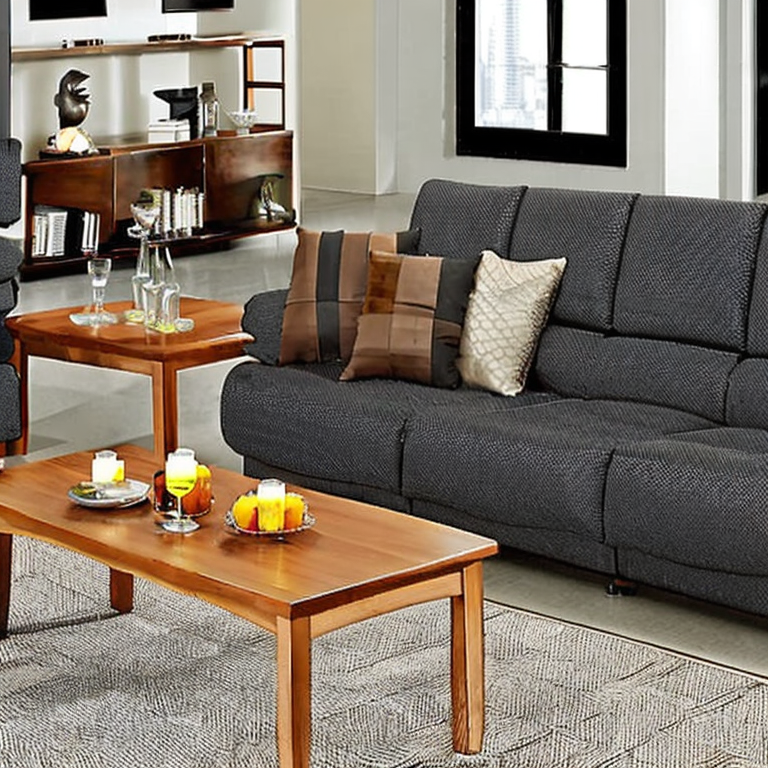

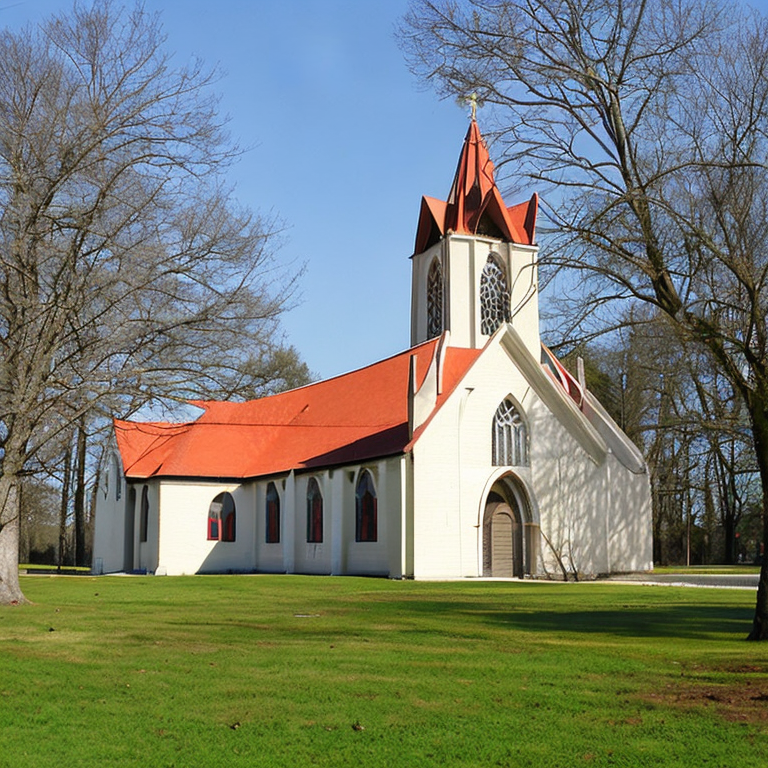

In [ ]:
from IPython.display import Image, display

for image_path in images_paths:
    display(Image(filename=image_path))

### Glosses images

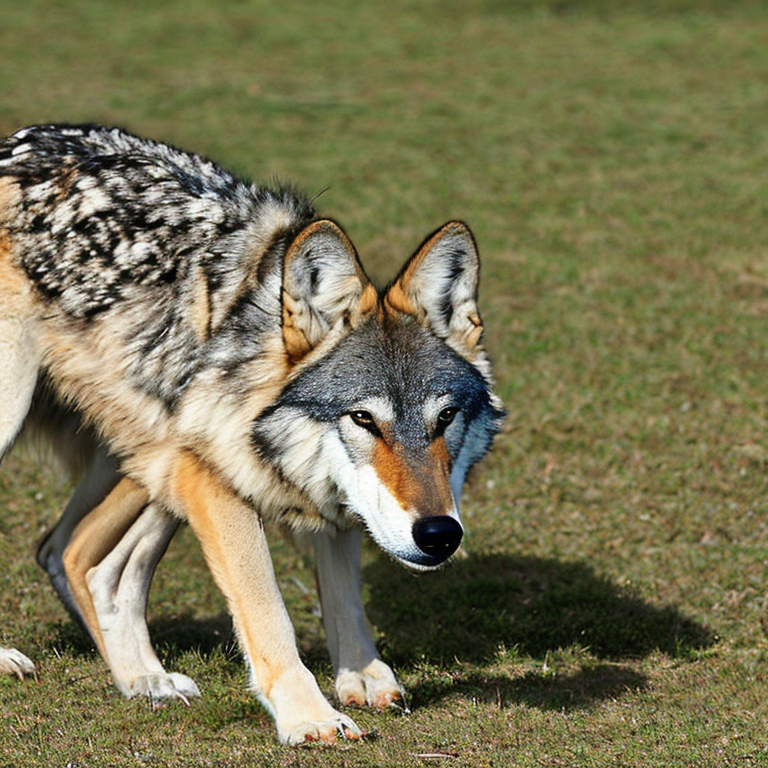

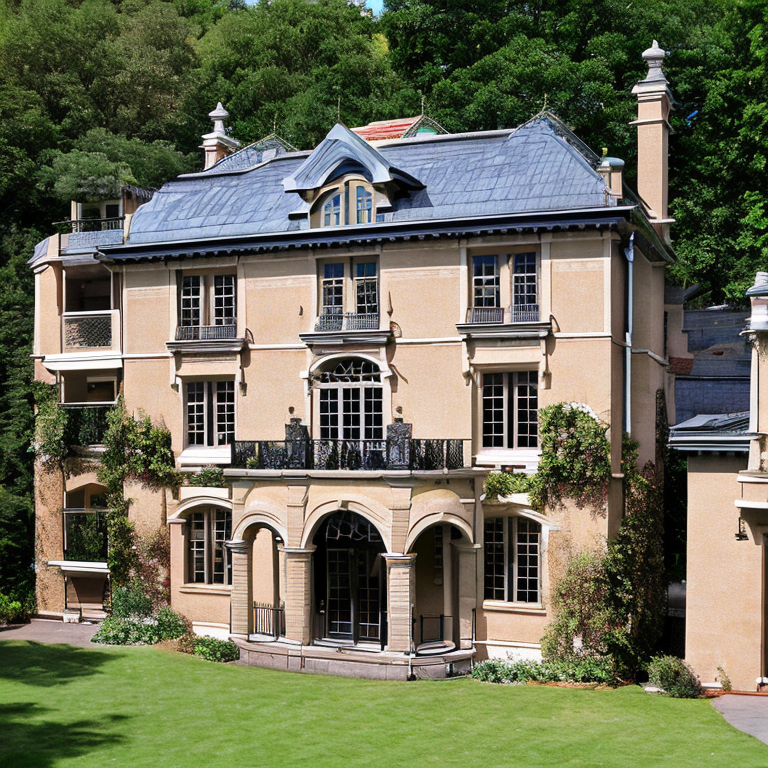

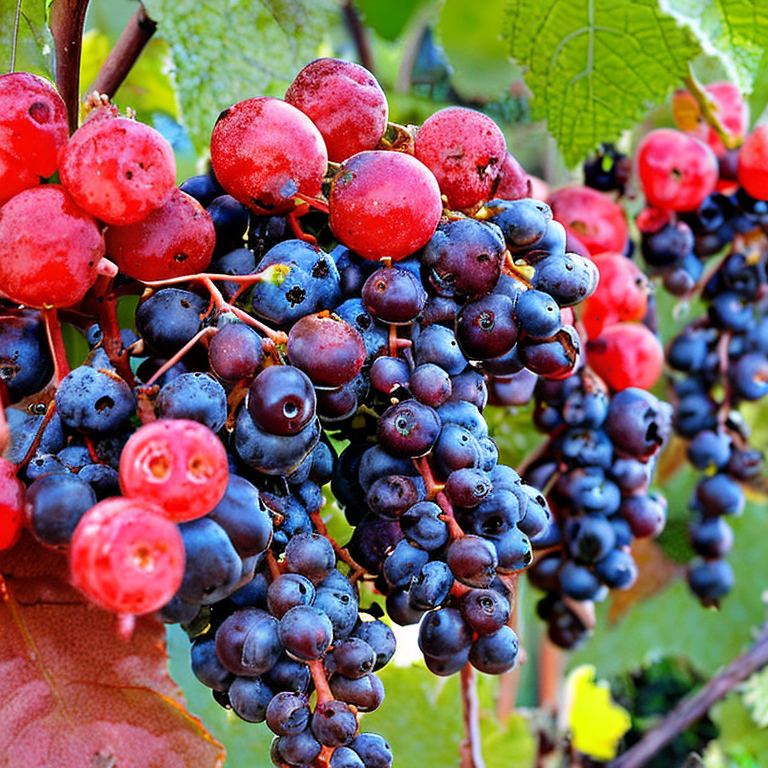

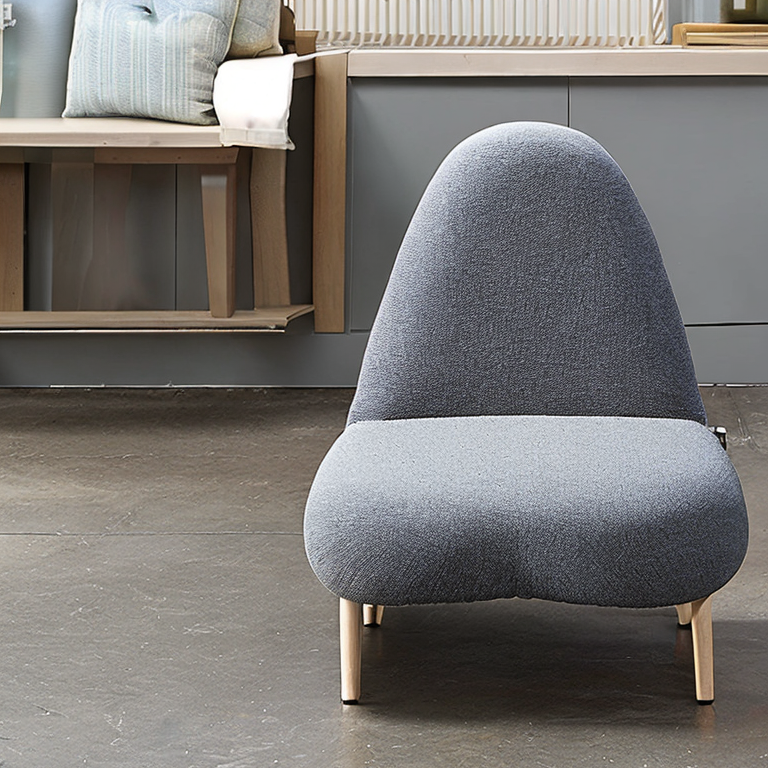

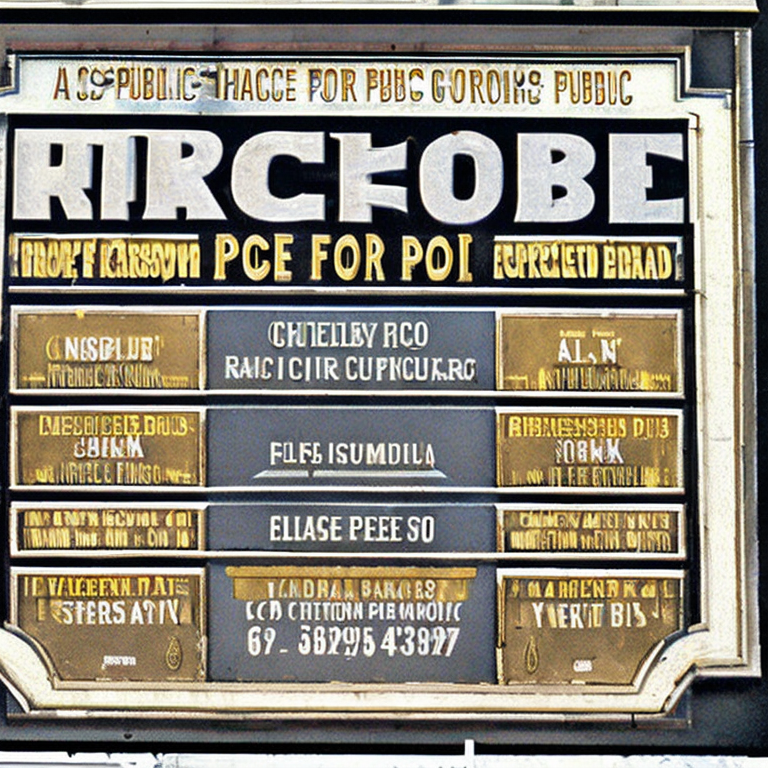

In [ ]:
for image_path in images_path_glosses:
    display(Image(filename=image_path))

## Review of the images and conclusion

It is clear, just by watching the different images, that glosses are not ideal for image generation. Let's analyze all the different images, comparing the prompts and the generated image.

Let's start with *dog.n.01*. For the lemmas, we have "dog, domestic dog, Canis familiaris": which leaves room for machine interpretation. The generated image is of a Beagle, a common hound or dog, running. This perfectly fits our model.
For the glosses, we have "a member of the genus Canis (probably descended from the common wolf) that has been domesticated by man since prehistoric times; occurs in many breeds": this description overfits the model so much that the generated image is, in fact, of a wolf and not a dog.

The same process applies for the sofa: the description overfits our model and causes it to generate a *chair for two*.

For the last image, the problem is very, very clear: the model does not have a subject to generate, and it defaults to a visual description. This happens a lot with glosses, and it is a secondary problem originating from what was previously described.